In [2]:
%load_ext autoreload
%autoreload 2

In [1]:
from src.datasets import FunctionDataset, kinematic
from src.architecture.models import LinearMDN, LinearNet
from src.training import train_loop, mdn_loss, test_loop

from torch.utils.data import DataLoader
from torch.utils.data import Dataset

import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

from sklearn.preprocessing import StandardScaler

import torch

In [73]:
TRAIN_SAMPLES = 5000
TEST_SAMPLES = 10000

function_range = (0, 1)

noise_level = 0.0
batch_size = 128
n_epochs = 200

device = "cuda" if torch.cuda.is_available() else "cpu"

In [105]:
class KinematicDataset(Dataset):
    def __init__(self, samples, noise_level, inverse: bool = True, sorting: bool = False):
        self.samples = samples
        self.noise_level = noise_level
        self.inverse = inverse

        # set theta to (samples, 2) in range (0.3, 1.2) for the first param and (pi/2, 3pi/2) for the second param
        self.theta1 = np.random.uniform(0.3, 1.2, (samples, 1))
        self.theta2 = np.random.uniform(np.pi/2, 3*np.pi/2, (samples, 1))

        # Convert to torch tensors
        self.theta1 = torch.from_numpy(self.theta1).float()
        self.theta2 = torch.from_numpy(self.theta2).float()

        self.x = kinematic(self.theta1, self.theta2)
        self.x1 = self.x[:, 0].unsqueeze(1)
        self.x2 = self.x[:, 1].unsqueeze(1)

        if self.inverse:
            self.x1, self.x2, self.theta1, self.theta2 = self.theta1, self.theta2, self.x1, self.x2

        # Sort the data in R2 space with x1, x2
        if sorting:
            sorted_indices = np.lexsort((self.x2, self.x1))
            self.x1 = self.x1[sorted_indices]
            self.x2 = self.x2[sorted_indices]
            self.theta1 = self.theta1[sorted_indices]
            self.theta2 = self.theta2[sorted_indices]

        # self.x1 += np.random.normal(0, noise_level, (samples, 1))
        # self.x2 += np.random.normal(0, noise_level, (samples, 1))

        # self.theta1 += np.random.normal(0, noise_level, (samples, 1))
        # self.theta2 += np.random.normal(0, noise_level, (samples, 1))

        # Convert to float32
        self.x1 = self.x1.float()
        self.x2 = self.x2.float()
        self.theta1 = self.theta1.float()
        self.theta2 = self.theta2.float()

        self.scaler_x1 = StandardScaler()
        self.scaler_x2 = StandardScaler()
        self.scaler_theta1 = StandardScaler()
        self.scaler_theta2 = StandardScaler()

        self.x1 = self.scaler_x1.fit_transform(self.x1)
        self.x2 = self.scaler_x2.fit_transform(self.x2)
        self.theta1 = self.scaler_theta1.fit_transform(self.theta1)
        self.theta2 = self.scaler_theta2.fit_transform(self.theta2)

        # Convert to torch tensors
        self.x1 = torch.from_numpy(self.x1).float()
        self.x2 = torch.from_numpy(self.x2).float()
        self.theta1 = torch.from_numpy(self.theta1).float()
        self.theta2 = torch.from_numpy(self.theta2).float()

        print(self.x1.shape, self.x2.shape, self.theta1.shape, self.theta2.shape)

        print()

    def __len__(self):
        return self.samples

    def __getitem__(self, idx):
        # return (self.x1[idx], self.x2[idx]), (self.theta1[idx], self.theta2[idx])

        x = torch.cat((self.x1[idx], self.x2[idx]), dim=0)
        theta = torch.cat((self.theta1[idx], self.theta2[idx]), dim=0)

        return x, theta

In [106]:
kinematic_train_dataset = KinematicDataset(TRAIN_SAMPLES, noise_level, inverse=True)
kinematic_test_dataset = KinematicDataset(TEST_SAMPLES, noise_level, inverse=True)

train_dataloader = DataLoader(kinematic_train_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(kinematic_test_dataset, batch_size=batch_size, shuffle=True)

torch.Size([5000, 1]) torch.Size([5000, 1]) torch.Size([5000, 1]) torch.Size([5000, 1])

torch.Size([10000, 1]) torch.Size([10000, 1]) torch.Size([10000, 1]) torch.Size([10000, 1])



In [107]:
# Get a batch of training data
x, theta = next(iter(train_dataloader))
x1, x2 = x[:, 0], x[:, 1]
theta1, theta2 = theta[:, 0], theta[:, 1]

print(x1.shape, x2.shape, theta1.shape, theta2.shape)

print(x1)

# Convert back to the scale
x1 = torch.from_numpy(kinematic_train_dataset.scaler_x1.inverse_transform(x1.unsqueeze(1)).squeeze()).float()
x2 = torch.from_numpy(kinematic_train_dataset.scaler_x2.inverse_transform(x2.unsqueeze(1)).squeeze()).float()
theta1 = torch.from_numpy(kinematic_train_dataset.scaler_theta1.inverse_transform(theta1.unsqueeze(1)).squeeze()).float()
theta2 = torch.from_numpy(kinematic_train_dataset.scaler_theta2.inverse_transform(theta2.unsqueeze(1)).squeeze()).float()

print(x1)

x1.shape, x2.shape, theta1.shape, theta2.shape

torch.Size([128]) torch.Size([128]) torch.Size([128]) torch.Size([128])
tensor([ 1.4977,  0.0758,  1.0338, -0.5548, -0.4157,  0.9804, -0.0246, -1.0471,
        -1.5266,  0.2202, -0.7020,  0.3511,  0.7569, -1.1642, -1.1317, -0.6549,
        -1.1181, -1.3603, -0.0685,  1.6343,  1.4135,  1.2768, -0.5836,  1.2187,
         1.4752,  1.5812, -0.1525,  1.2608,  1.5276, -0.2734,  1.1694, -1.5917,
        -0.2661,  0.8766, -0.6026,  0.5416, -0.5489, -1.0011,  1.4278,  1.6209,
         0.9218, -0.5052,  0.0668, -0.4463, -0.9405, -0.9863, -1.3035, -1.7297,
         0.3975, -0.2206,  0.9121, -1.6230, -1.3834,  1.0157, -0.4129,  0.2700,
        -0.9913,  1.5170, -0.3772,  0.0151,  0.0098,  0.6730, -1.6513,  0.2997,
        -0.1501,  1.3433, -0.0620, -0.8018, -0.5358, -1.1329,  1.6566,  0.9899,
        -1.3359, -0.3738,  0.0244, -0.7268, -0.3000,  0.0499,  0.8439,  0.4843,
         1.5137, -0.0043, -1.2942, -1.1951, -1.6897,  1.4670,  1.2873,  0.2055,
         0.1722, -0.9122,  0.2558,  0.3392,  0.5

(torch.Size([128]), torch.Size([128]), torch.Size([128]), torch.Size([128]))

In [77]:
def scale_back(value, scaler):
    return torch.from_numpy(scaler.inverse_transform(value).squeeze()).float()

torch.Size([5000, 1]) torch.Size([5000, 1]) torch.Size([5000, 1])


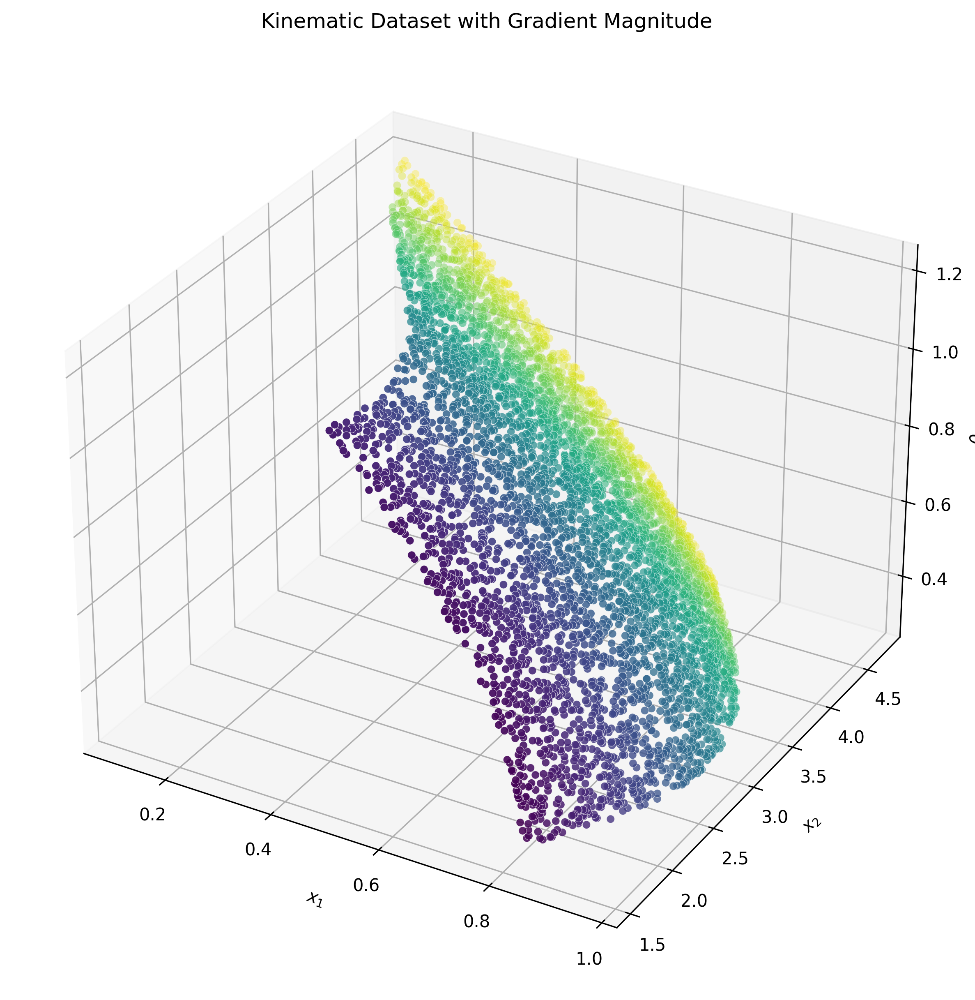

In [78]:
# Sample data
x1 = kinematic_train_dataset.theta1
x2 = kinematic_train_dataset.x2
x3 = kinematic_train_dataset.x1

print(x1.shape, x2.shape, x3.shape)

x1 = scale_back(x1, kinematic_train_dataset.scaler_theta1)
x2 = scale_back(x2, kinematic_train_dataset.scaler_x2)
x3 = scale_back(x3, kinematic_train_dataset.scaler_x1)

# Calculate gradient magnitude
gradient_mag = np.sqrt(x1**2 + x2**2 + x3**2)

# Plot 3D scatter plot
fig = plt.figure(figsize=(10, 10), dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Use plot_trisurf for scatter plot with gradient
scatter = ax.scatter(x1, x2, x3, c=gradient_mag, cmap='viridis', s=22, marker='o', edgecolor="white", linewidth=0.2)

# Add colorbar for the gradient
# cbar = plt.colorbar(scatter, ax=ax)
# cbar.set_label('Gradient Magnitude')

ax.set_xlabel("$x_1$")
ax.set_ylabel("$x_2$")
ax.set_zlabel("$\\theta_1$")
plt.title("Kinematic Dataset with Gradient Magnitude")
plt.show()


c:\Users\Antoine\AppData\Local\Programs\Python\Python39\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0, 0.5, 'x2')

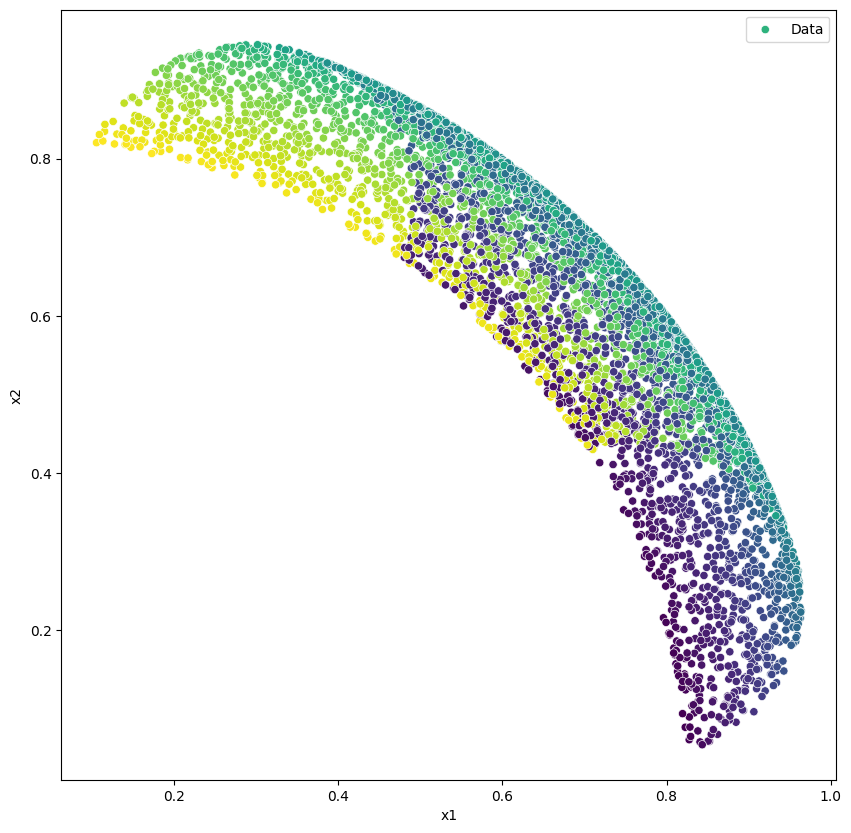

In [79]:
plt.figure(figsize=(10, 10))

theta1 = kinematic_train_dataset.theta1
theta2 = kinematic_train_dataset.theta2

theta1 = scale_back(theta1, kinematic_train_dataset.scaler_theta1)
theta2 = scale_back(theta2, kinematic_train_dataset.scaler_theta2)

grad_mag = np.sqrt(theta1**2 + theta2**2)
sns.scatterplot(theta1.flatten(), theta2.flatten(), label="Data", c=gradient_mag)
# We used theta1 as x1 and theta2 as x2 because of the inversion
plt.xlabel("x1")
plt.ylabel("x2")

In [29]:
EPOCHS = 200

def train_linear():
    model = LinearNet(input_dimension=2, hidden_dims=[5, 10, 15, 20, 23, 30], output_dimension=2).to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
    mse_loss = torch.nn.MSELoss()

    train_losses = []
    test_losses = []

    progress_bar = tqdm(range(EPOCHS))
    for _ in progress_bar:
        train_losses.append(
            train_loop(
                model,
                train_dataloader,
                optimizer,
                loss_function=mse_loss,
                device=device,
            )
        )

        test_losses.append(
            test_loop(model, test_dataloader, loss_function=mse_loss, device=device)
        )

        progress_bar.set_description(
            f"Train loss: {train_losses[-1]:.4f}, Test loss: {test_losses[-1]:.4f}"
        )

    return model, train_losses, test_losses

In [30]:
model_linear, train_losses_linear, test_losses_linear = train_linear()

Train loss: 0.0003, Test loss: 0.0012: 100%|██████████| 200/200 [01:03<00:00,  3.16it/s]


Text(0, 0.5, 'Loss')

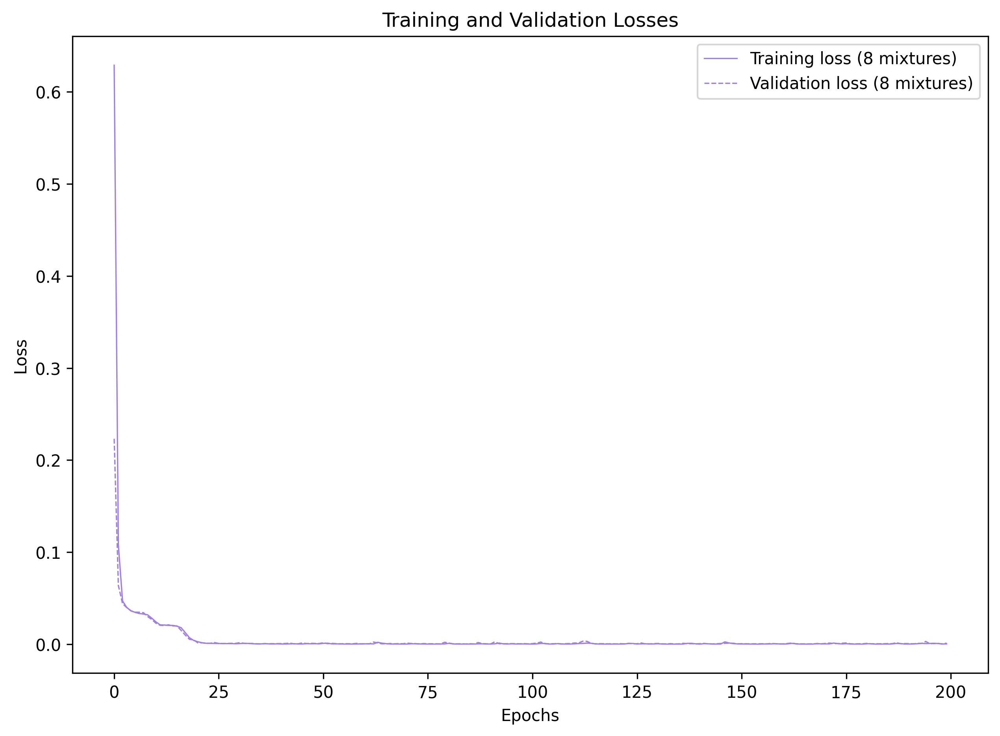

In [31]:
plt.figure(figsize=(10, 7), dpi=300)

plt.plot(train_losses_linear, label="Training loss (8 mixtures)", linewidth=0.8, color="#a17fe0")
plt.plot(test_losses_linear, label="Validation loss (8 mixtures)", linewidth=0.8, color="#a17fe0", linestyle="--")

# Make xticks integers
plt.xticks(np.arange(0, EPOCHS+1, 25))

plt.legend()
plt.title("Training and Validation Losses")
plt.xlabel("Epochs")
plt.ylabel("Loss")

In [166]:
EPOCHS = 200

def train_mixtures(n_mixtures=3, hidden_dims=[5, 10, 15, 20, 25, 30]):
    model = LinearMDN(
        input_dimension=2,
        hidden_dims=hidden_dims,
        output_dimension=2,
        n_mixtures=n_mixtures
    ).to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

    train_losses = []
    test_losses = []

    print("Training with model with {} mixtures".format(n_mixtures))

    progress_bar = tqdm(range(EPOCHS))
    for _ in progress_bar:
        train_losses.append(
            train_loop(
                model,
                train_dataloader,
                optimizer,
                loss_function=mdn_loss,
                device=device,
            )
        )

        test_losses.append(
            test_loop(model, test_dataloader, loss_function=mdn_loss, device=device)
        )

        progress_bar.set_description(
            f"Train loss: {train_losses[-1]:.4f}, Test loss: {test_losses[-1]:.4f}"
        )

    return model, train_losses, test_losses

In [168]:
hidden_dims = [5, 10, 15, 20, 25, 30]#[64, 128, 256, 512, 256, 128, 64, 24]#[5, 10, 15, 20, 25, 30, 50, 30, 20, 8]
#[5, 10, 15, 20, 23, 30]#[5, 15, 25, 50, 75, 100, 75, 50, 30, 8]##
EPOCHS = 200

In [169]:
model_2m, train_losses_2m, test_losses_2m = train_mixtures(n_mixtures=2, hidden_dims=hidden_dims)#[64, 256, 512, 128, 64])

ModuleList(
  (0): Linear(in_features=2, out_features=5, bias=True)
  (1): Linear(in_features=5, out_features=10, bias=True)
  (2): Linear(in_features=10, out_features=15, bias=True)
  (3): Linear(in_features=15, out_features=20, bias=True)
  (4): Linear(in_features=20, out_features=25, bias=True)
  (5): Linear(in_features=25, out_features=30, bias=True)
  (6): Linear(in_features=30, out_features=8, bias=True)
)
Training with model with 2 mixtures


Train loss: -3.4135, Test loss: 1.5137: 100%|██████████| 200/200 [01:54<00:00,  1.75it/s] 


In [170]:
model_3m, train_losses_3m, test_losses_3m = train_mixtures(n_mixtures=3, hidden_dims=hidden_dims)

ModuleList(
  (0): Linear(in_features=2, out_features=5, bias=True)
  (1): Linear(in_features=5, out_features=10, bias=True)
  (2): Linear(in_features=10, out_features=15, bias=True)
  (3): Linear(in_features=15, out_features=20, bias=True)
  (4): Linear(in_features=20, out_features=25, bias=True)
  (5): Linear(in_features=25, out_features=30, bias=True)
  (6): Linear(in_features=30, out_features=12, bias=True)
)
Training with model with 3 mixtures


Train loss: -3.6188, Test loss: -2.1935: 100%|██████████| 200/200 [01:56<00:00,  1.71it/s]


In [131]:
model_5m, train_losses_5m, test_losses_5m = train_mixtures(n_mixtures=5, hidden_dims=hidden_dims)

ModuleList(
  (0): Linear(in_features=2, out_features=64, bias=True)
  (1): Linear(in_features=64, out_features=128, bias=True)
  (2): Linear(in_features=128, out_features=256, bias=True)
  (3): Linear(in_features=256, out_features=512, bias=True)
  (4): Linear(in_features=512, out_features=256, bias=True)
  (5): Linear(in_features=256, out_features=128, bias=True)
  (6): Linear(in_features=128, out_features=64, bias=True)
  (7): Linear(in_features=64, out_features=24, bias=True)
  (8): Linear(in_features=24, out_features=20, bias=True)
)
Training with model with 5 mixtures


Train loss: -2.1219, Test loss: -1.0452: 100%|██████████| 150/150 [01:21<00:00,  1.84it/s]


In [132]:
model_8m, train_losses_8m, test_losses_8m = train_mixtures(n_mixtures=8, hidden_dims=hidden_dims)

ModuleList(
  (0): Linear(in_features=2, out_features=64, bias=True)
  (1): Linear(in_features=64, out_features=128, bias=True)
  (2): Linear(in_features=128, out_features=256, bias=True)
  (3): Linear(in_features=256, out_features=512, bias=True)
  (4): Linear(in_features=512, out_features=256, bias=True)
  (5): Linear(in_features=256, out_features=128, bias=True)
  (6): Linear(in_features=128, out_features=64, bias=True)
  (7): Linear(in_features=64, out_features=24, bias=True)
  (8): Linear(in_features=24, out_features=32, bias=True)
)
Training with model with 8 mixtures


Train loss: -2.1604, Test loss: -1.9872: 100%|██████████| 150/150 [01:20<00:00,  1.85it/s]


In [133]:
model_10m, train_losses_10m, test_losses_10m = train_mixtures(n_mixtures=10, hidden_dims=hidden_dims)

ModuleList(
  (0): Linear(in_features=2, out_features=64, bias=True)
  (1): Linear(in_features=64, out_features=128, bias=True)
  (2): Linear(in_features=128, out_features=256, bias=True)
  (3): Linear(in_features=256, out_features=512, bias=True)
  (4): Linear(in_features=512, out_features=256, bias=True)
  (5): Linear(in_features=256, out_features=128, bias=True)
  (6): Linear(in_features=128, out_features=64, bias=True)
  (7): Linear(in_features=64, out_features=24, bias=True)
  (8): Linear(in_features=24, out_features=40, bias=True)
)
Training with model with 10 mixtures


Train loss: -2.0749, Test loss: -2.3797: 100%|██████████| 150/150 [01:19<00:00,  1.89it/s]


In [165]:
# torch.save(model_2m.state_dict(), "models/kinematic_final_2m.pt")
# torch.save(model_3m.state_dict(), "models/kinematic_final_3m.pt")
# torch.save(model_8m.state_dict(), "models/kinematic_8m.pt")
# torch.save(model_10m.state_dict(), "models/kinematic_10m.pt")

Text(0, 0.5, 'Loss')

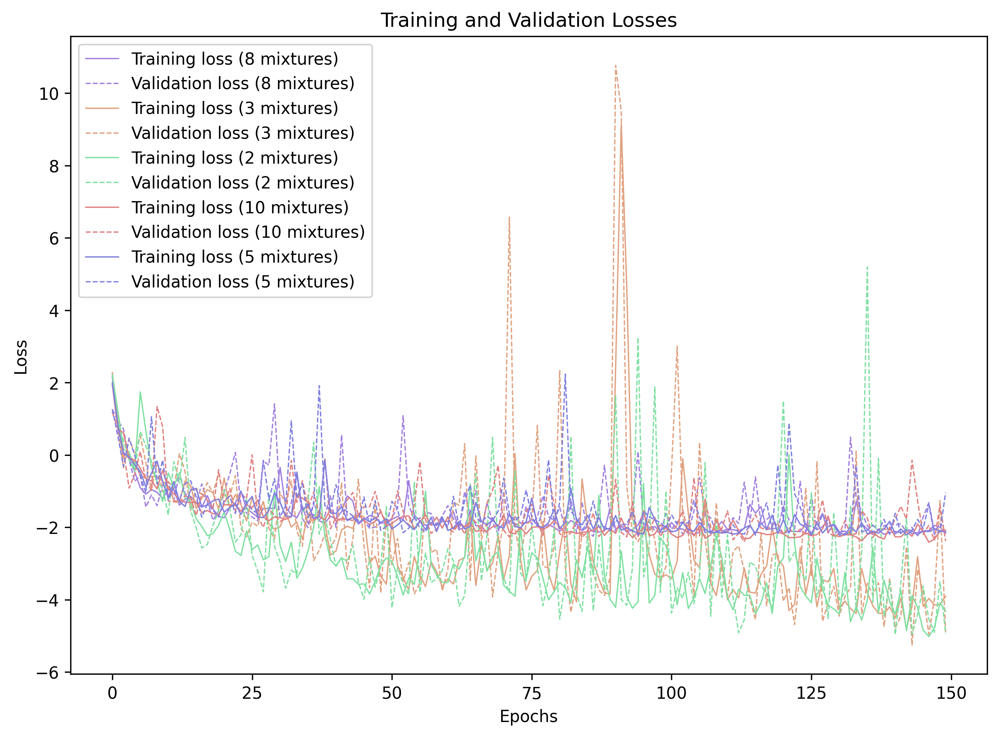

In [136]:
plt.figure(figsize=(10, 7), dpi=300)

plt.plot(train_losses_8m, label="Training loss (8 mixtures)", linewidth=0.8, color="#a17fe0")
plt.plot(test_losses_8m, label="Validation loss (8 mixtures)", linewidth=0.8, color="#a17fe0", linestyle="--")

plt.plot(train_losses_3m, label="Training loss (3 mixtures)", linewidth=0.8, color="#e0a17f")
plt.plot(test_losses_3m, label="Validation loss (3 mixtures)", linewidth=0.8, color="#e0a17f", linestyle="--")

plt.plot(train_losses_2m, label="Training loss (2 mixtures)", linewidth=0.8, color="#7fe0a1")
plt.plot(test_losses_2m, label="Validation loss (2 mixtures)", linewidth=0.8, color="#7fe0a1", linestyle="--")

plt.plot(train_losses_10m, label="Training loss (10 mixtures)", linewidth=0.8, color="#e07f7f")
plt.plot(test_losses_10m, label="Validation loss (10 mixtures)", linewidth=0.8, color="#e07f7f", linestyle="--")

plt.plot(train_losses_5m, label="Training loss (5 mixtures)", linewidth=0.8, color="#7f7fe0")
plt.plot(test_losses_5m, label="Validation loss (5 mixtures)", linewidth=0.8, color="#7f7fe0", linestyle="--")

# Make xticks integers
plt.xticks(np.arange(0, EPOCHS+1, 25))

plt.legend()
plt.title("Training and Validation Losses")
plt.xlabel("Epochs")
plt.ylabel("Loss")


In [137]:
def extract_mixtures(model):
    # Get mu, sigma and pi from the test_loader
    mu, sigma, pi, truth = [], [], [], []
    for x, theta in test_dataloader:
        x = x.cuda()
        theta = theta.cuda()

        mu_, sigma_, pi_ = model(x)

        mu.append(mu_.detach().cpu().numpy())
        sigma.append(sigma_.detach().cpu().numpy())
        pi.append(pi_.detach().cpu().numpy())
        truth.append(theta.detach().cpu().numpy())

    mu = np.concatenate(mu)
    sigma = np.concatenate(sigma)
    pi = np.concatenate(pi)
    truth = np.concatenate(truth)

    # Get the best mu zhere the pi is the highest
    best_mu = np.zeros_like(truth)
    for i in range(len(pi)):
        best_mu[i] = mu[i, np.argmax(pi[i])]

    return mu, sigma, pi, truth, best_mu

In [138]:
def compute_distance_loss(model):
    mu, sigma, pi, truth, best_mu = extract_mixtures(model)

    # Compute the loss
    loss = np.sqrt(np.sum((truth - best_mu)**2, axis=1))

    return loss

In [139]:
outputs = []
truth = []
for x, theta in test_dataloader:
    x = x.cuda()
    theta = theta.cuda()

    outputs.append(model_linear(x))
    truth.append(theta)

outputs = torch.cat(outputs).detach().cpu().numpy()
truth = torch.cat(truth).detach().cpu().numpy()

# draw a line between each point in best_mu and truth
offsets = outputs - truth
distances = np.sqrt(np.sum(offsets**2, axis=1))

In [141]:
print("Linear model distance loss: {}".format(np.mean(distances)))
print("2 mixtures distance loss: {}".format(np.mean(compute_distance_loss(model_2m))))
print("3 mixtures distance loss: {}".format(np.mean(compute_distance_loss(model_3m))))
print("5 mixtures distance loss: {}".format(np.mean(compute_distance_loss(model_5m))))
print("8 mixtures distance loss: {}".format(np.mean(compute_distance_loss(model_8m))))
print("10 mixtures distance loss: {}".format(np.mean(compute_distance_loss(model_10m))))

Linear model distance loss: 0.04230009764432907
2 mixtures distance loss: 0.026063865050673485
3 mixtures distance loss: 0.02647251822054386
5 mixtures distance loss: 0.2758244574069977
8 mixtures distance loss: 0.25848397612571716
10 mixtures distance loss: 0.26264145970344543


In [153]:
# Import convex hull
from scipy.spatial import ConvexHull


def show_offset(model):
    # For all test data compute the output of the model
    mu, sigma, pi, truth, best_mu = extract_mixtures(model)

    # draw a line between each point in best_mu and truth
    offsets = best_mu - truth
    distances = np.sqrt(np.sum(offsets**2, axis=1))

    # Convex hull of all best_mu
    hull = ConvexHull(best_mu, qhull_options="QJ")
    true_hull = ConvexHull(truth, qhull_options="QJ")

    # hull.vertices += [hull.points[0]]
    # true_hull.vertices += [true_hull.points[0]]
    print(hull.points)

    # Get points on the convex hull
    hull_points = best_mu[hull.vertices]
    true_hull_points = truth[true_hull.vertices]

    max_points = 1500

    # Plot the offsets
    plt.figure(figsize=(10, 10), dpi=300)

    # plt.scatter(
    #     truth[:max_points, 0],
    #     truth[:max_points, 1],
    #     c="b",
    #     label="True $\\theta$",
    #     s=32,
    #     edgecolor="white",
    #     linewidth=0.8,
    # )

    # color_palette = sns.color_palette("husl", model.n_mixtures)
    # for i in range(model.n_mixtures):
    #     plt.scatter(
    #         mu[:max_points, i, 0],
    #         mu[:max_points, i, 1],
    #         c=color_palette[i],
    #         label="Convex Hull",
    #         s=32,
    #         edgecolor="white",
    #         linewidth=0.8,
    #     )

    plt.plot(
        [truth[:max_points, 0], best_mu[:max_points, 0]],
        [truth[:max_points, 1], best_mu[:max_points, 1]],
        # c=distances[:max_points],
        # cmap='plasma',
        c="r",
        alpha=0.2,
        linewidth=0.8,
    )
    # Plot the convex hull
    plt.plot(best_mu[hull.vertices, 0], best_mu[hull.vertices, 1], "r--", lw=0.8)
    plt.plot(truth[true_hull.vertices, 0], truth[true_hull.vertices, 1], "b--", lw=0.8)
    # Close the convex hull by joining the last point to the first
    plt.plot([hull_points[-1, 0], hull_points[0, 0]], [hull_points[-1, 1], hull_points[0, 1]], "r--", lw=0.8)
    plt.plot([true_hull_points[-1, 0], true_hull_points[0, 0]], [true_hull_points[-1, 1], true_hull_points[0, 1]], "b--", lw=0.8)


    # Plot the hull points
    # plt.scatter(
    #     hull_points[:, 0],
    #     hull_points[:, 1],
    #     c="r",
    #     label="Convex Hull",
    #     s=32,
    #     edgecolor="white",
    #     linewidth=0.8,
    # )
    # plt.scatter(
    #     true_hull_points[:, 0],
    #     true_hull_points[:, 1],
    #     c="b",
    #     label="True Convex Hull",
    #     s=32,
    #     edgecolor="white",
    #     linewidth=0.8,
    # )

    plt.xlabel("$x_1$")
    plt.ylabel("$x_2$")
    plt.title("Offset between predicted and true $\\theta$ for {} mixtures".format(model.n_mixtures))


    plt.legend()
    plt.show()

In [154]:
mu, sigma, pi, truth, best_mu = extract_mixtures(model_2m)

# Get argmax of pi
argmax_pi = np.argmax(pi, axis=1)
print(np.unique(argmax_pi), list(argmax_pi).count(0), list(argmax_pi).count(1), list(argmax_pi).count(2))

[0 1] 8759 1241 0


[[ 0.10747145 -0.55260926]
 [ 0.98668641 -2.72672033]
 [-0.30359739  0.72579181]
 ...
 [ 0.1214993  -0.60739112]
 [-0.36818534  0.3926048 ]
 [-0.2961117   0.53010011]]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


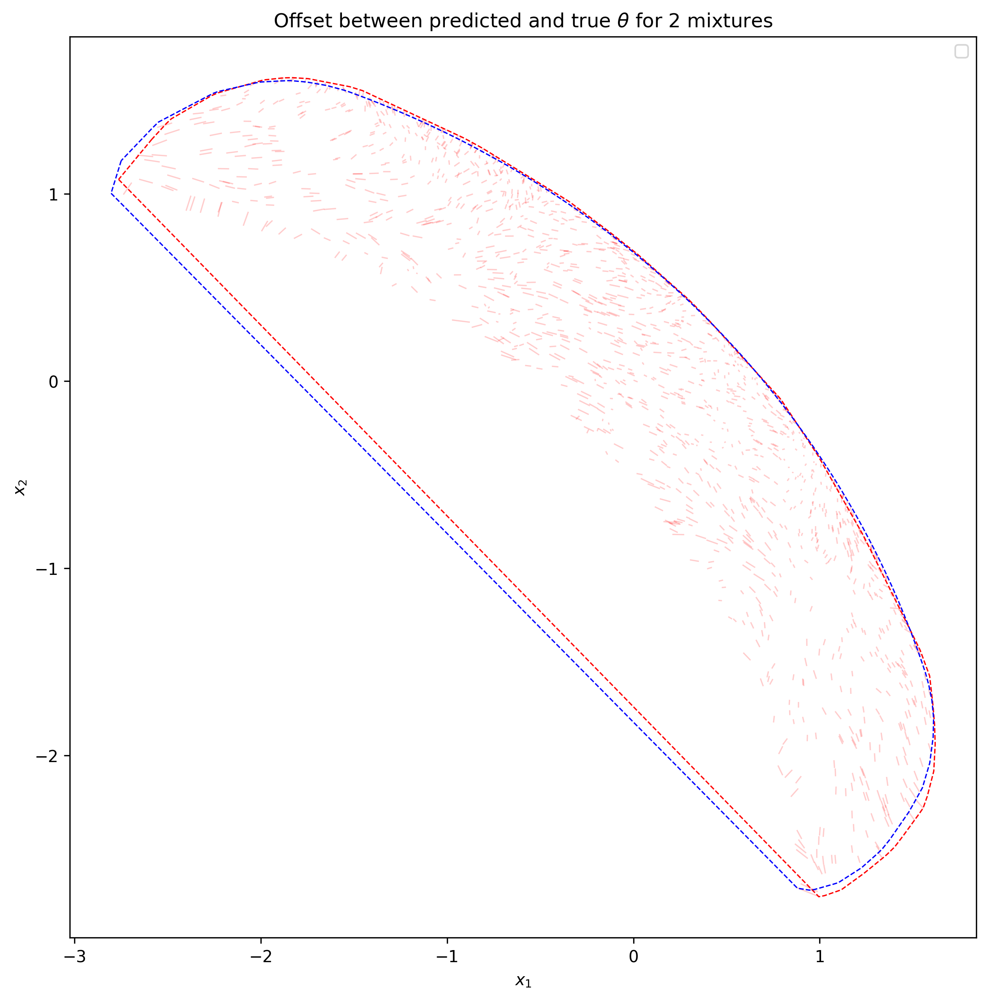

[[-0.40589914  0.92262012]
 [-0.31613463  0.638138  ]
 [ 0.83079934 -0.32437888]
 ...
 [-1.08357108  0.90446687]
 [ 1.00556862 -0.40087256]
 [ 0.0409436  -0.35471287]]


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


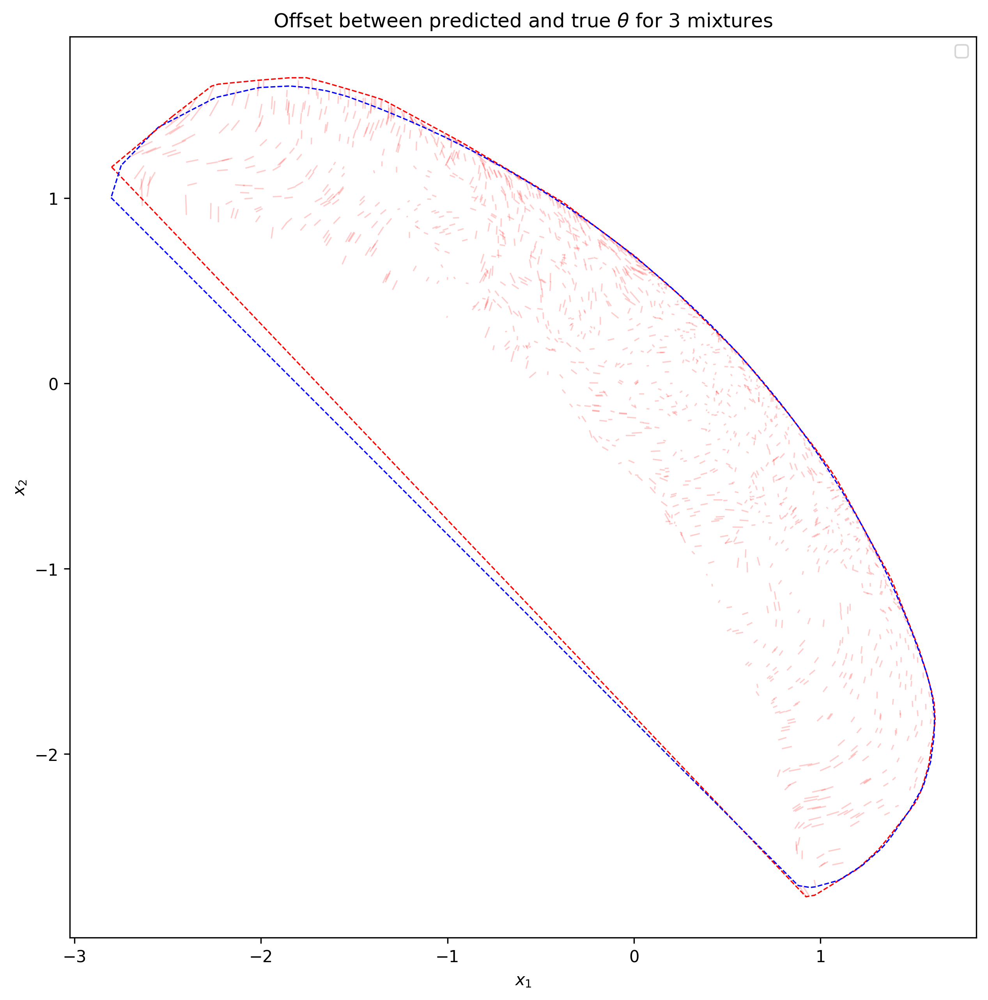

In [155]:
show_offset(model_2m)
show_offset(model_3m)
# show_offset(model_5m)
# show_offset(model_8m)
# show_offset(model_10m)

(10000, 2)
(10000, 3)


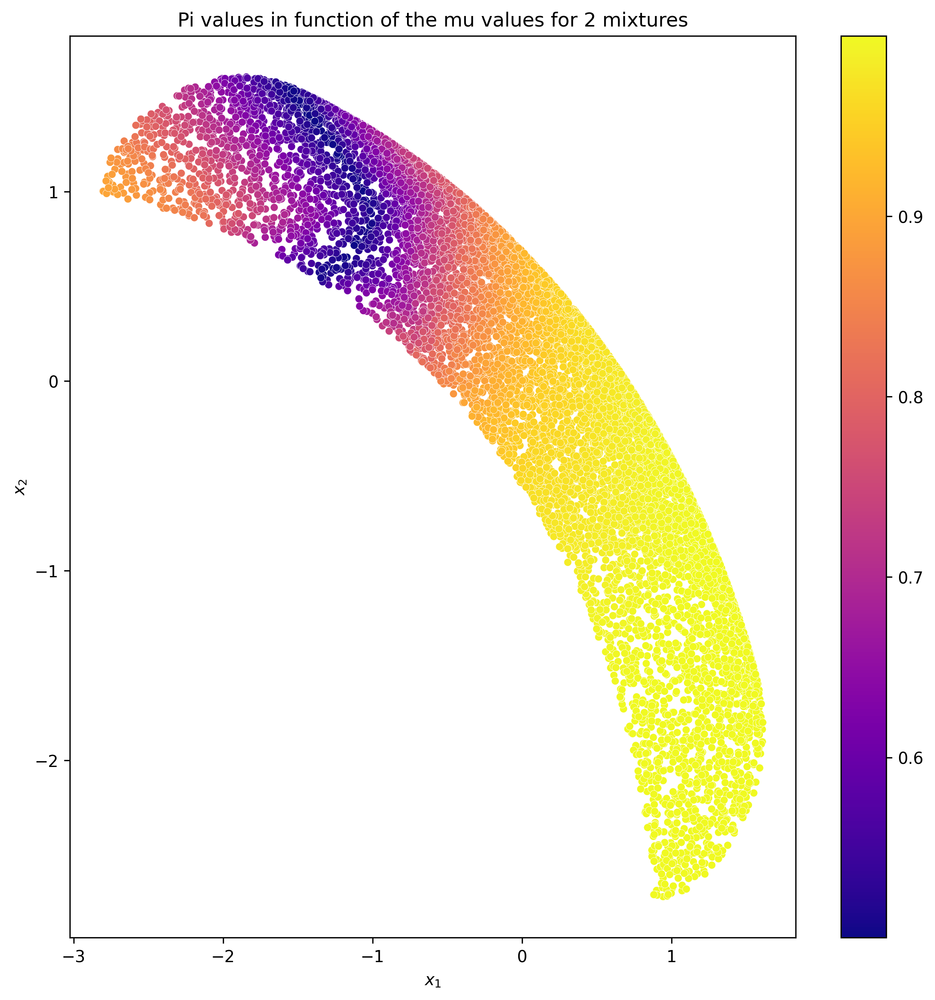

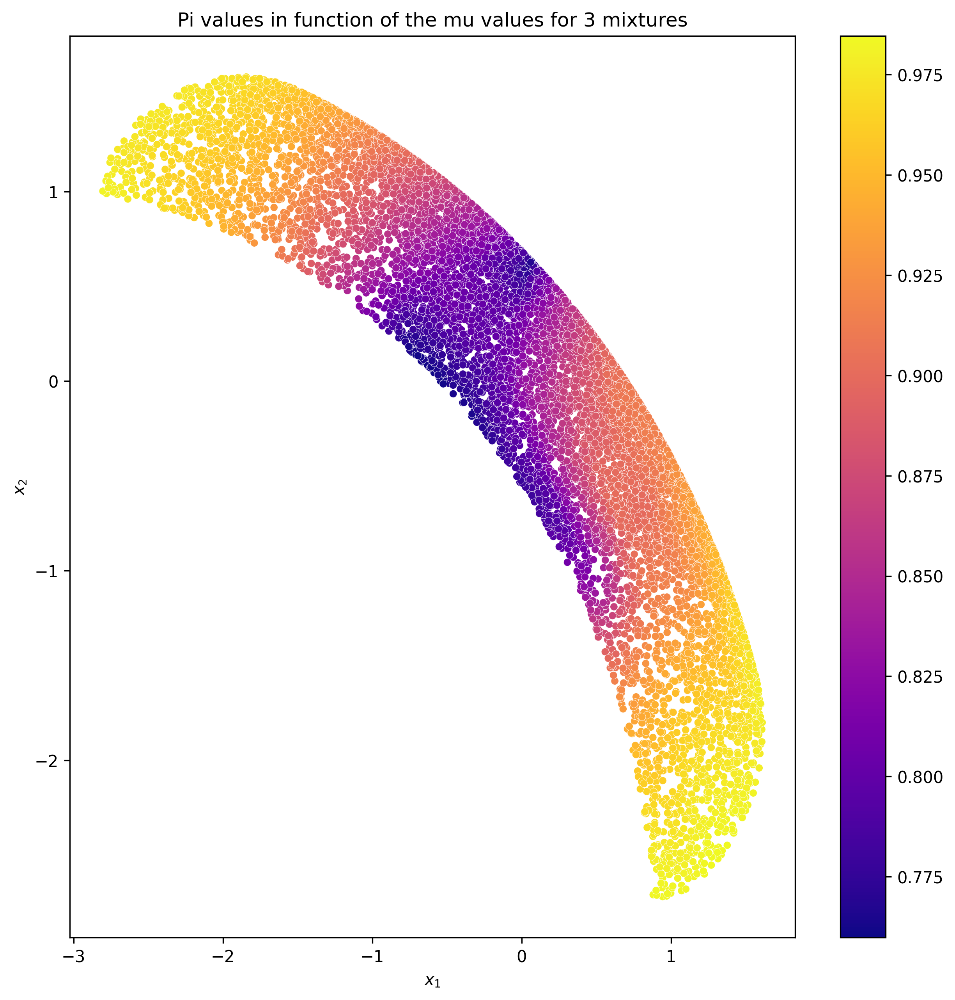

In [156]:
# Plot 3d scatter plot of the pi values in function of the mu values

def show_pi_mu(model):
    # For all test data compute the output of the model
    mu, sigma, pi, truth, best_mu = extract_mixtures(model)

    fig = plt.figure(figsize=(10, 10), dpi=300)
    # ax = fig.add_subplot(111, projection='3d')

    x1 = truth[:, 0]
    x2 = truth[:, 1]
    # Get max pi value
    x3 = np.max(pi, axis=1)

    print(pi.shape)

    # Use plot_trisurf for scatter plot with gradient
    # ax.scatter(x1, x2, x3, cmap='viridis', s=22, marker='o', edgecolor="white", linewidth=0.2)

    plt.scatter(x1, x2, c=x3, cmap='plasma', s=22, marker='o', edgecolor="white", linewidth=0.2)

    # Add colorbar for the gradient
    cbar = plt.colorbar()

    plt.xlabel("$x_1$")
    plt.ylabel("$x_2$")
    plt.title("Pi values in function of the mu values for {} mixtures".format(model.n_mixtures))


show_pi_mu(model_2m)
show_pi_mu(model_3m)

In [163]:

def show_offset_linear(model):
    # For all test data compute the output of the model
    outputs = []
    truth = []
    for x, theta in test_dataloader:
        x = x.cuda()
        theta = theta.cuda()

        outputs.append(model(x))
        truth.append(theta)

    outputs = torch.cat(outputs).detach().cpu().numpy()
    truth = torch.cat(truth).detach().cpu().numpy()

    # draw a line between each point in best_mu and truth
    offsets = outputs - truth
    distances = np.sqrt(np.sum(offsets**2, axis=1))

    # Convex hull of all best_mu
    hull = ConvexHull(outputs, qhull_options="QJ")
    true_hull = ConvexHull(truth, qhull_options="QJ")

    # Get points on the convex hull
    hull_points = outputs[hull.vertices]
    true_hull_points = truth[true_hull.vertices]

    max_points = 3500

    # Plot the offsets
    plt.figure(figsize=(10, 10), dpi=300)
    plt.plot(
        [truth[:max_points, 0], outputs[:max_points, 0]],
        [truth[:max_points, 1], outputs[:max_points, 1]],
        # c=distances[:max_points],
        # cmap='plasma',
        c="g",
        alpha=0.2,
        linewidth=0.8,
    )
    # Plot the convex hull
    plt.plot(outputs[hull.vertices, 0], outputs[hull.vertices, 1], "g--", lw=0.8)
    plt.plot(truth[true_hull.vertices, 0], truth[true_hull.vertices, 1], "b--", lw=0.8)

    # Close the convex hull by joining the last point to the first
    plt.plot([hull_points[-1, 0], hull_points[0, 0]], [hull_points[-1, 1], hull_points[0, 1]], "g--", lw=0.8)
    plt.plot([true_hull_points[-1, 0], true_hull_points[0, 0]], [true_hull_points[-1, 1], true_hull_points[0, 1]], "b--", lw=0.8)

    # Plot the hull points
    plt.scatter(
        hull_points[:, 0],
        hull_points[:, 1],
        c="g",
        label="Convex Hull",
        s=32,
        edgecolor="white",
        linewidth=0.8,
    )
    plt.scatter(
        true_hull_points[:, 0],
        true_hull_points[:, 1],
        c="b",
        label="True Convex Hull",
        s=32,
        edgecolor="white",
        linewidth=0.8,
    )

    plt.xlabel("$x_1$")
    plt.ylabel("$x_2$")
    plt.title("Offset between predicted and true $\\theta$ for a MLP")


    plt.legend()
    plt.show()

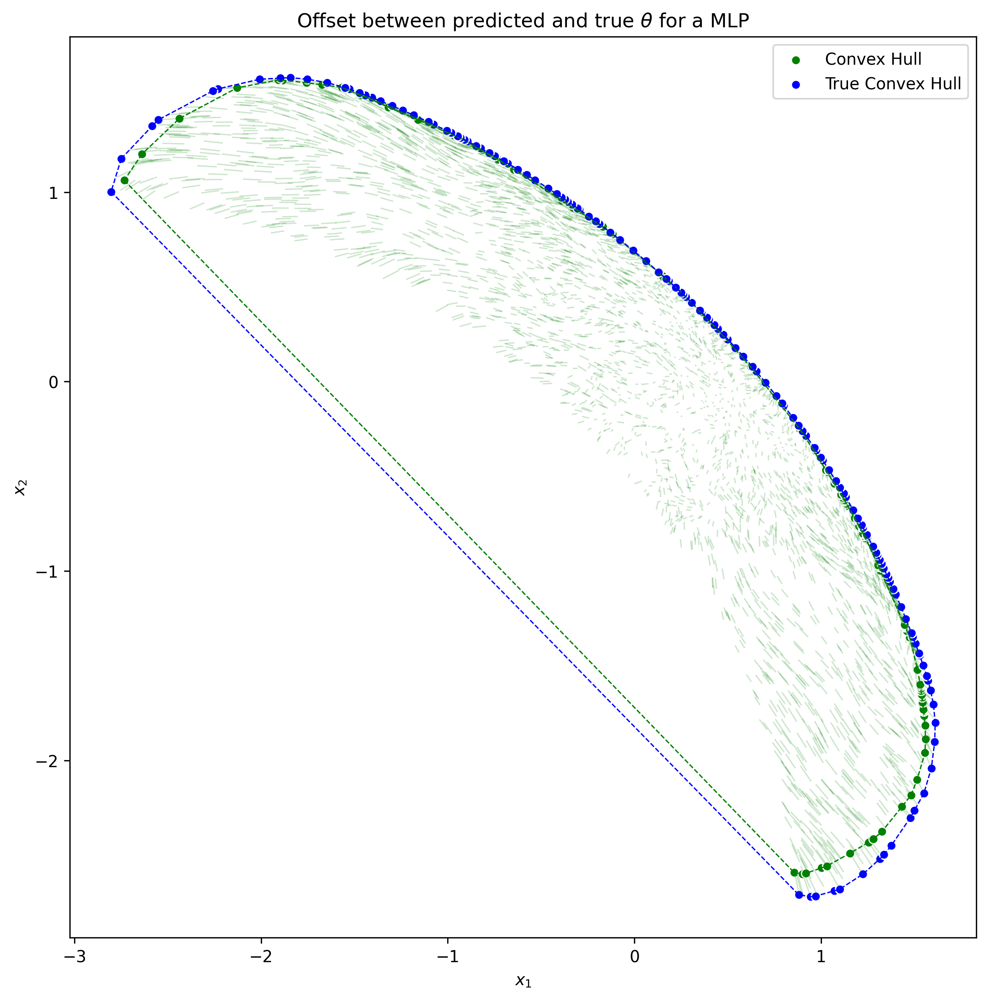

In [164]:
show_offset_linear(model_linear)